In [34]:
import pandas as pd

In [35]:
data = pd.read_excel("fraud.xlsx")

In [3]:
data

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud
0,2019-04-01 00:58:00,"""Stokes, Christiansen and Sipes""",grocery_net,14.37,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",1939-09-11 00:00:00,a3806e984cec6ac0096d8184c64ad3a1,65.654142,-164.722603,1
1,2019-04-01 15:06:00,Predovic Inc,shopping_net,966.11,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",1939-09-11 00:00:00,a59185fe1b9ccf21323f581d7477573f,65.468863,-165.473127,1
2,2019-04-01 22:37:00,Wisozk and Sons,misc_pos,49.61,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",1939-09-11 00:00:00,86ba3a888b42cd3925881fa34177b4e0,65.347667,-165.914542,1
3,2019-04-01 23:06:00,Murray-Smitham,grocery_pos,295.26,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",1939-09-11 00:00:00,3a068fe1d856f0ecedbed33e4b5f4496,64.445035,-166.080207,1
4,2019-04-01 23:59:00,Friesen Lt,health_fitness,18.17,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",1939-09-11 00:00:00,891cdd1191028759dc20dc224347a0ff,65.447094,-165.446843,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14441,22-01-2019 00:37,Hudson-Grady,shopping_pos,122.00,Athena,OR,45.8289,-118.4971,1302,Dealer,18-10-1976,699a4c06b22711bf3e0d8ef91232d356,46.442439,-118.524214,0
14442,22-01-2019 00:41,"""Nienow, Ankunding and Collie""",misc_pos,9.07,Gardiner,OR,43.7857,-124.1437,260,"""Engineer, maintenance""",1956-01-09 00:00:00,080d620d24815c7d6c637cf0b71dde8e,42.901265,-124.995317,0
14443,22-01-2019 00:42,Pacocha-O'Reilly,grocery_pos,104.84,Alva,WY,44.6873,-104.4414,110,"""Administrator, local government""",16-05-1973,3c346c8cd627c5fe3ed57430db2e9ae7,45.538062,-104.542117,0
14444,22-01-2019 00:48,"""Bins, Balistreri and Beatty""",shopping_pos,268.16,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",1939-09-11 00:00:00,e66ffcc95ba7fc490486242af1205d04,64.081462,-165.898698,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14446 entries, 0 to 14445
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   trans_date_trans_time  14446 non-null  object 
 1   merchant               14446 non-null  object 
 2   category               14446 non-null  object 
 3   amt                    14446 non-null  float64
 4   city                   14446 non-null  object 
 5   state                  14446 non-null  object 
 6   lat                    14446 non-null  float64
 7   long                   14446 non-null  float64
 8   city_pop               14446 non-null  int64  
 9   job                    14446 non-null  object 
 10  dob                    14446 non-null  object 
 11  trans_num              14446 non-null  object 
 12  merch_lat              14446 non-null  float64
 13  merch_long             14446 non-null  float64
 14  is_fraud               14446 non-null  int64  
dtypes:

# Clustering

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors

from scipy import stats

from geopy.distance import geodesic
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
sns.set(style='whitegrid')


In [32]:
data = pd.read_excel("fraud.xlsx")

# Menampilkan 5 baris pertama data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14446 entries, 0 to 14445
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   trans_date_trans_time  14446 non-null  object 
 1   merchant               14446 non-null  object 
 2   category               14446 non-null  object 
 3   amt                    14446 non-null  float64
 4   city                   14446 non-null  object 
 5   state                  14446 non-null  object 
 6   lat                    14446 non-null  float64
 7   long                   14446 non-null  float64
 8   city_pop               14446 non-null  int64  
 9   job                    14446 non-null  object 
 10  dob                    14446 non-null  object 
 11  trans_num              14446 non-null  object 
 12  merch_lat              14446 non-null  float64
 13  merch_long             14446 non-null  float64
 14  is_fraud               14446 non-null  int64  
dtypes:

In [17]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS, Birch
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.cluster import BisectingKMeans  # Pastikan pustaka ini terinstal

# Memuat data
data = pd.read_excel("fraud.xlsx")
features = data[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long']]

# Definisikan fungsi untuk setiap metode klastering dengan 3 kluster
def apply_kmeans(X):
    model = KMeans(n_clusters=3, random_state=0)
    model.fit(X)
    return model.labels_

def apply_agglomerative(X):
    model = AgglomerativeClustering(n_clusters=3)
    return model.fit_predict(X)

def apply_gmm(X):
    model = GaussianMixture(n_components=3, random_state=0)
    labels = model.fit_predict(X)
    return labels

def apply_bisecting_kmeans(X):
    model = BisectingKMeans(n_clusters=3, random_state=0)
    model.fit(X)
    return model.labels_

def apply_ward(X):
    Z = linkage(X, method='ward')
    labels = fcluster(Z, 3, criterion='maxclust')
    return labels

def apply_complete(X):
    Z = linkage(X, method='complete')
    labels = fcluster(Z, 3, criterion='maxclust')
    return labels

def apply_average(X):
    Z = linkage(X, method='average')
    labels = fcluster(Z, 3, criterion='maxclust')
    return labels

def apply_single(X):
    Z = linkage(X, method='single')
    labels = fcluster(Z, 3, criterion='maxclust')
    return labels

def apply_birch(X):
    model = Birch(n_clusters=3)
    model.fit(X)
    return model.labels_

# Dictionary dengan metode klastering yang menggunakan 3 kluster
clustering_methods = {
    'K-Means': apply_kmeans,
    #'Agglomerative': apply_agglomerative,
    #'GMM': apply_gmm,
    #'Bisecting K-Means Clustering': apply_bisecting_kmeans,
    #'Ward Hierarchical Clustering': apply_ward,
    #'Complete Hierarchical Clustering': apply_complete,
    #'Average Hierarchical Clustering': apply_average,
    #'Single Hierarchical Clustering': apply_single,
    #'BIRCH Clustering': apply_birch,
}

# Evaluasi setiap metode
results = []

for method_name, method_func in clustering_methods.items():
    try:
        labels = method_func(features)
        # Menghitung metrik evaluasi
        silhouette = silhouette_score(features, labels) if len(set(labels)) > 1 else np.nan
        calinski = calinski_harabasz_score(features, labels) if len(set(labels)) > 1 else np.nan
        davies = davies_bouldin_score(features, labels) if len(set(labels)) > 1 else np.nan
        results.append([method_name, silhouette, calinski, davies])
    except Exception as e:
        # Jika metode gagal, hasil diberi nilai NaN
        results.append([method_name, np.nan, np.nan, np.nan])

# Membuat DataFrame untuk hasil evaluasi
results_df = pd.DataFrame(results, columns=['Method', 'Silhouette Score', 'Calinski-Harabasz Index', 'Davies-Bouldin Index'])
results_df.sort_values(by='Silhouette Score', ascending=False, inplace=True)

results_df

,Method,Silhouette Score,Calinski-Harabasz Index,Davies-Bouldin Index
0,K-Means,0.890565,76841.57872,0.406156


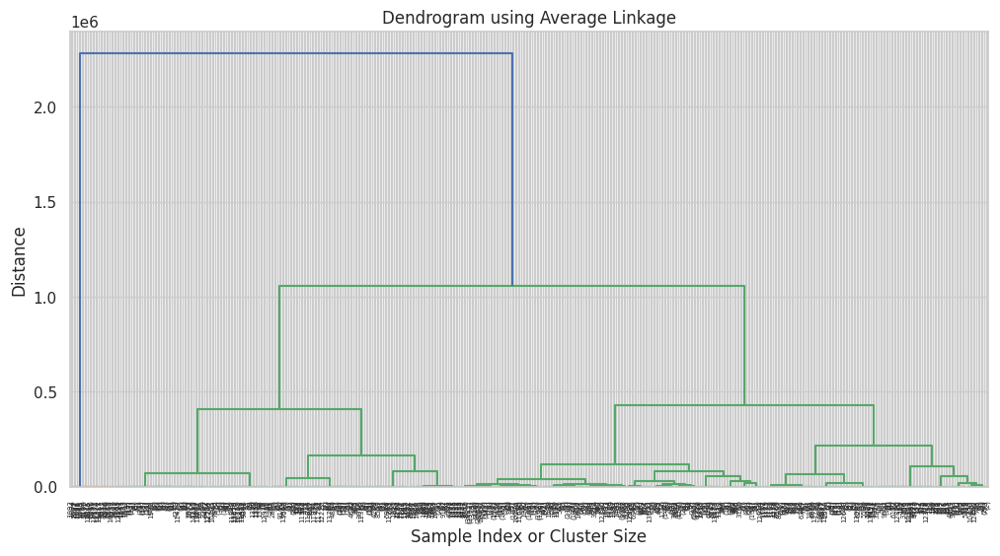

In [10]:
from scipy.cluster.hierarchy import dendrogram

# Applying hierarchical clustering linkage for the dendrogram
Z = linkage(features, method='average')

# Plotting the dendrogram
plt.figure(figsize=(12, 6))
dendrogram(Z, truncate_mode='level', p=10)  # truncate_mode='level' limits the number of levels displayed
plt.title("Dendrogram using Average Linkage")
plt.xlabel("Sample Index or Cluster Size")
plt.ylabel("Distance")
plt.show()

In [19]:
# Assign labels to the original data
data['Cluster'] = apply_kmeans(features)

# Calculate summary statistics for each cluster
cluster_summary = data.groupby('Cluster').agg({
    'amt': ['mean', 'median', 'min', 'max', 'std'],
    'lat': ['mean', 'median', 'min', 'max', 'std'],
    'long': ['mean', 'median', 'min', 'max', 'std'],
    'city_pop': ['mean', 'median', 'min', 'max', 'std'],
    'merch_lat': ['mean', 'median', 'min', 'max', 'std'],
    'merch_long': ['mean', 'median', 'min', 'max', 'std']
})

In [20]:
cluster_summary.transpose()

Cluster                       0              1              2
amt        mean    1.179421e+02     122.876704     152.831711
           median  4.857000e+01      51.210000      57.900000
           min     1.010000e+00       1.000000       1.030000
           max     1.209700e+03    3261.470000    1234.320000
           std     2.092602e+02     230.862041     252.471904
lat        mean    3.466001e+01      40.055503      39.741176
           median  3.356230e+01      40.029000      38.962100
           min     3.271850e+01      20.027100      33.431700
           max     3.861710e+01      66.693300      47.663300
           std     1.946467e+00       5.419276       3.048074
long       mean   -1.141560e+02    -110.779516    -109.750473
           median -1.121202e+02    -111.029200    -105.004400
           min    -1.217913e+02    -165.672300    -122.703300
           max    -9.045040e+01     -89.628700     -94.595900
           std     7.449687e+00      13.339382      10.340258
city_pop   mean    1.242362e+06   19681.360991  530960.108265
           median  1.241364e+06    1288.000000  525713.000000
           min     9.273960e+05      46.000000  299480.000000
           max     2.383912e+06  233717.000000  841711.000000
           std     2.858122e+05   41709.089757  179647.782755
merch_lat  mean    3.464886e+01      40.058517      39.709533
           median  3.383841e+01      39.951289      39.172202
           min     3.175876e+01      19.032689      32.540641
           max     3.961623e+01      67.510267      48.623846
           std     2.042145e+00       5.462492       3.102557
merch_long mean   -1.141508e+02    -110.778406    -109.782449
           median -1.130315e+02    -110.662282    -105.733968
           min    -1.227895e+02    -166.670685    -123.666291
           max    -8.945188e+01     -88.646366     -93.612668
           std     7.464318e+00      13.349364      10.349601

In [21]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import plotly.express as px
# Memuat data
data = pd.read_excel("fraud.xlsx")
features = data[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long']]

# Hasil klasterisasi
labels = apply_kmeans(features)  # Fungsi apply_average sesuai dengan definisi Anda

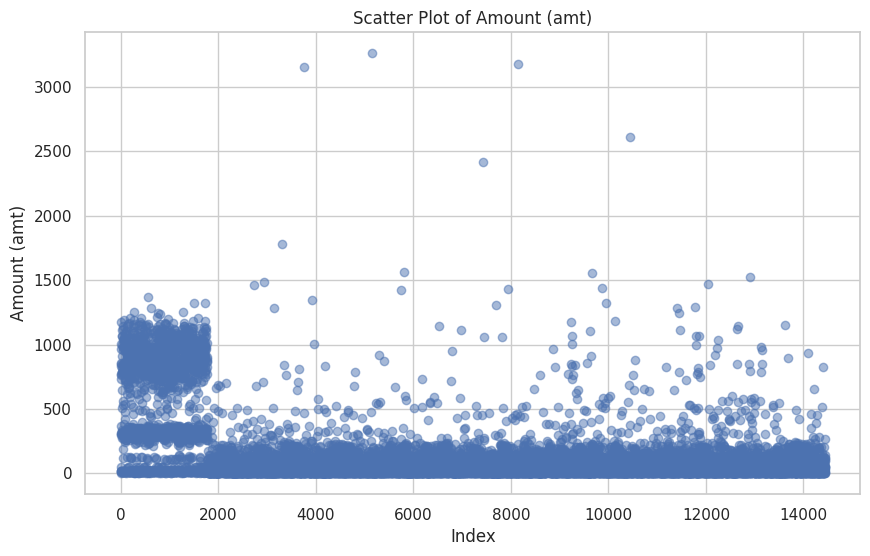

In [33]:
plt.figure(figsize=(10, 6))
plt.scatter(data.index, data['amt'], alpha=0.5)
plt.xlabel('Index')
plt.ylabel('Amount (amt)')
plt.title('Scatter Plot of Amount (amt)')
plt.show()

In [22]:
data['Cluster'] = labels
cluster_data = data[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long', 'Cluster']]
cluster_data

,amt,lat,long,city_pop,merch_lat,merch_long,Cluster
0,14.37,64.7556,-165.6723,145,65.654142,-164.722603,1
1,966.11,64.7556,-165.6723,145,65.468863,-165.473127,1
2,49.61,64.7556,-165.6723,145,65.347667,-165.914542,1
3,295.26,64.7556,-165.6723,145,64.445035,-166.080207,1
4,18.17,64.7556,-165.6723,145,65.447094,-165.446843,1
...,...,...,...,...,...,...,...
14441,122.00,45.8289,-118.4971,1302,46.442439,-118.524214,1
14442,9.07,43.7857,-124.1437,260,42.901265,-124.995317,1
14443,104.84,44.6873,-104.4414,110,45.538062,-104.542117,1
14444,268.16,64.7556,-165.6723,145,64.081462,-165.898698,1


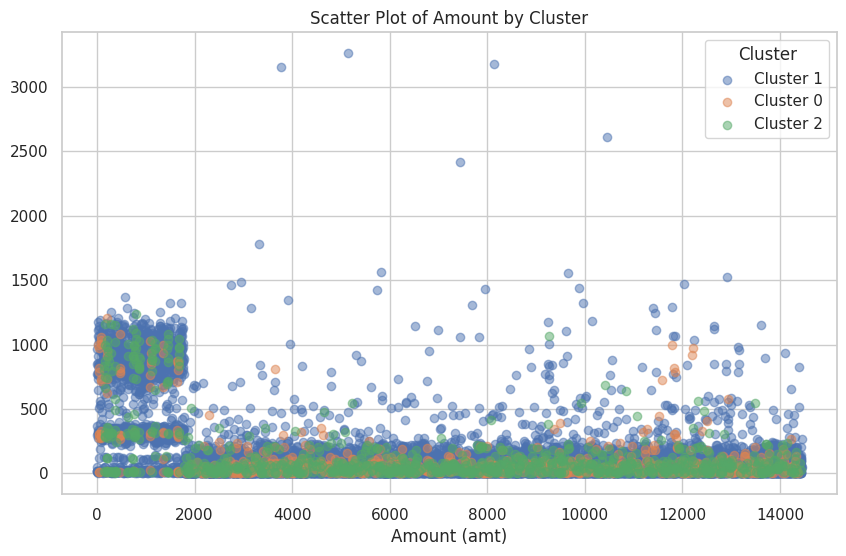

In [28]:
# Extracting relevant columns for scatter plot
cluster_data = data[['amt', 'Cluster']]

# Creating scatter plot
plt.figure(figsize=(10, 6))
for cluster in cluster_data['Cluster'].unique():
    clustered_data = cluster_data[cluster_data['Cluster'] == cluster]
    plt.scatter(clustered_data.index,clustered_data['amt'] , label=f'Cluster {cluster}', alpha=0.5)

plt.xlabel('Amount (amt)')
plt.legend(title='Cluster')
plt.title('Scatter Plot of Amount by Cluster')
plt.show()

In [ ]:
pca_1d = PCA(n_components=1)
components_1d = pca_1d.fit_transform(features)
df_1d = pd.DataFrame(data=components_1d, columns=['PC1'])
df_1d['Cluster'] = labels

In [ ]:
fig_1d = px.scatter(df_1d, x='PC1', color='Cluster', title='Visualisasi Klaster dalam 1D')
fig_1d.show()

In [ ]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(features)
df_2d = pd.DataFrame(data=components_2d, columns=['PC1', 'PC2'])
df_2d['Cluster'] = labels

In [ ]:
fig_2d = px.scatter(df_2d, x='PC1', y='PC2', color='Cluster', title='Visualisasi Klaster dalam 2D')
fig_2d.show()

In [ ]:
pca_3d = PCA(n_components=3)
components_3d = pca_3d.fit_transform(features)
df_3d = pd.DataFrame(data=components_3d, columns=['PC1', 'PC2', 'PC3'])
df_3d['Cluster'] = labels

In [ ]:
fig_3d = px.scatter_3d(df_3d, x='PC1', y='PC2', z='PC3', color='Cluster', title='Visualisasi Klaster dalam 3D')
fig_3d.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import plotly.express as px

In [ ]:
# Load data
data = pd.read_excel("fraud.xlsx")
features = data[['amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long']]
from scipy.cluster.hierarchy import linkage, fcluster

def apply_average(X):
    Z = linkage(X, method='average')
    labels = fcluster(Z, 3, criterion='maxclust')
    return labels

# Apply clustering
labels = apply_average(features)

In [ ]:
tsne_1d = TSNE(n_components=1, random_state=0)
projections_1d = tsne_1d.fit_transform(features)
df_1d = pd.DataFrame({'Dimension 1': projections_1d.flatten(), 'Cluster': labels})
fig_1d = px.scatter(df_1d, x='Dimension 1', color='Cluster', title='1D t-SNE Visualization')
fig_1d.show()

In [ ]:
tsne_2d = TSNE(n_components=2, random_state=0)
projections_2d = tsne_2d.fit_transform(features)
df_2d = pd.DataFrame({'Dimension 1': projections_2d[:, 0], 'Dimension 2': projections_2d[:, 1], 'Cluster': labels})
fig_2d = px.scatter(df_2d, x='Dimension 1', y='Dimension 2', color='Cluster', title='2D t-SNE Visualization')
fig_2d.show()

In [ ]:
tsne_3d = TSNE(n_components=3, random_state=0)
projections_3d = tsne_3d.fit_transform(features)
df_3d = pd.DataFrame({'Dimension 1': projections_3d[:, 0], 'Dimension 2': projections_3d[:, 1], 'Dimension 3': projections_3d[:, 2], 'Cluster': labels})
fig_3d = px.scatter_3d(df_3d, x='Dimension 1', y='Dimension 2', z='Dimension 3', color='Cluster', title='3D t-SNE Visualization')
fig_3d.show()

# More Interpretable Clustering